# Event signals — do simple features move systematically around TSMC and TAIFEX events?

Uses `cta.Event()` + `cta.Casr()` + `cta.Caar()` to run event studies on MTX
around three main event types:

| event | count | source |
|---|---|---|
| `tsmc_quarterly_call` | 86 | 4x/year 法說會 (perfectly aligned 2005-2025, Thursday 14:00 TPE) |
| `tsmc_investor_day`   | 4  | rare US-hosted capital-markets days (2018, 2022, 2025, 2026) |
| `tsmc_broker_conference` | 116 | invited broker/bank conferences (UBS, MS, JPM, Citi, ...) |
| `futures_expire` | 303 | TAIFEX monthly expiry (3rd Wednesday) |

Approach:
1. **Buy-and-hold CAAR** around each event → does the market move systematically?
2. **Build simple candidate signals** (returns, rolling-mean returns, volume, volatility)
3. For each **(signal × event)** pair, plot signal level around event (left) + CASR (right)

The goal is to spot which signals show a consistent pre- or post-event pattern that could be used as a tradeable event overlay.


In [1]:
import importlib, sys, warnings
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

warnings.filterwarnings("ignore", message="findfont: .* not found")
_inst = {f.name for f in fm.fontManager.ttflist}
_cand = ["Hiragino Sans GB","Heiti TC","Songti SC","PingFang SC","PingFang TC",
         "Arial Unicode MS","Noto Sans CJK TC","DejaVu Sans"]
mpl.rcParams["font.family"] = [f for f in _cand if f in _inst] or ["DejaVu Sans"]
mpl.rcParams["axes.unicode_minus"] = False

import cta
for _m in ["cta.operators","cta.tsmc_events","cta.simulate"]:
    if _m in sys.modules: importlib.reload(sys.modules[_m])
importlib.reload(cta)

ASSET = cta.load_asset("mtx", "1d")
cta.set_active_asset(ASSET)

WINDOW = 10   # ±10 trading days around each event by default

# Event distance series — one per event type
EVENTS = {
    "tsmc_quarterly_call":    cta.Event("tsmc_quarterly_call"),
    "tsmc_investor_day":      cta.Event("tsmc_investor_day"),
    "tsmc_broker_conference": cta.Event("tsmc_broker_conference"),
    "futures_expire":         cta.Event("futures_expire"),
}
for nm, ev in EVENTS.items():
    n = int((ev == 0).sum())
    print(f"  {nm:26s} → {n:4d} event days on MTX calendar")
print(f"\nMTX asset: {ASSET.symbol} {ASSET.time_granularity} "
      f"{len(ASSET):,} bars   ({ASSET.index.min().date()} → {ASSET.index.max().date()})")


  tsmc_quarterly_call        →   86 event days on MTX calendar
  tsmc_investor_day          →    4 event days on MTX calendar
  tsmc_broker_conference     →  116 event days on MTX calendar
  futures_expire             →  303 event days on MTX calendar

MTX asset: MTX 1d 6,210 bars   (2001-04-09 → 2026-06-26)


## 1. Buy-and-hold CAAR around each event

Feeds `asset.returns` (close-to-close pct change) into `cta.Caar` centered on each event category. If the market shows a systematic drift around an event type, the CAAR curve will trend up or down; a flat line means the event is priced-in (no free move to trade).


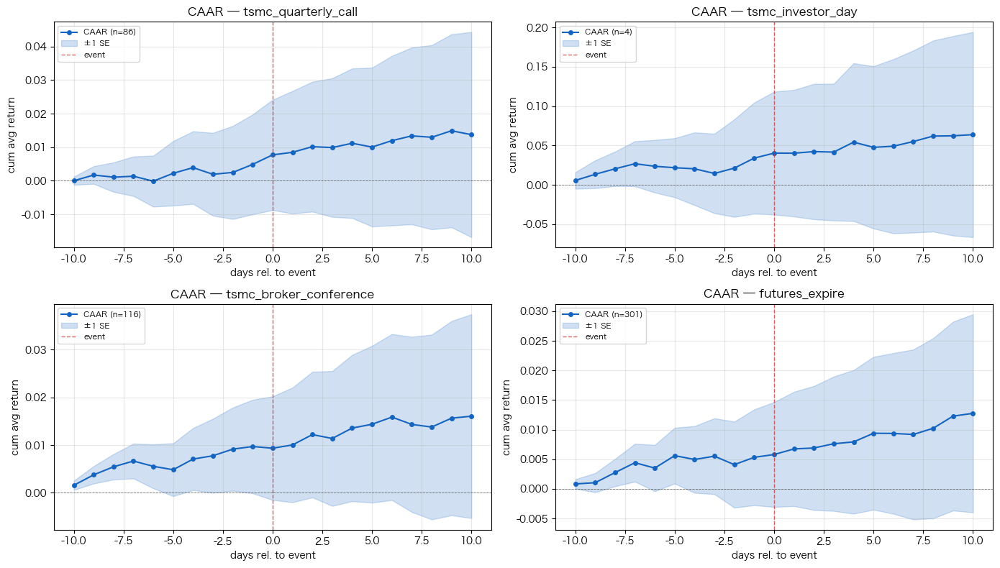

In [2]:
asset_ret = ASSET.returns

fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

for i, (name, ev) in enumerate(EVENTS.items()):
    ax = axes[i]
    ev_dates = ASSET.index[ev == 0]
    try:
        r = cta.Caar(WINDOW, asset_ret, event_dates=ev_dates)
    except ValueError as e:
        ax.text(0.5, 0.5, str(e), transform=ax.transAxes, ha='center', va='center')
        ax.set_title(name); continue
    x = r.index
    ax.plot(x, r["casr"], color="#1565c0", lw=1.5, marker="o", ms=4,
            label=f"CAAR (n={int(r['n'].iloc[0])})")
    cum_lo = np.cumsum(r["mean"] - r["se"])
    cum_hi = np.cumsum(r["mean"] + r["se"])
    ax.fill_between(x, cum_lo, cum_hi, alpha=0.20, color="#1565c0", label="±1 SE")
    ax.axvline(0, color="#c62828", lw=1.0, ls="--", alpha=0.7, label="event")
    ax.axhline(0, color="black", lw=0.6, ls="--", alpha=0.5)
    ax.set_title(f"CAAR — {name}")
    ax.set_xlabel("days rel. to event"); ax.set_ylabel("cum avg return")
    ax.legend(fontsize=8); ax.grid(alpha=0.3)

plt.tight_layout(); plt.show()


## 2. Build simple candidate signals

Six lightweight signals from raw MTX price/volume — no exotic transforms. Each is a feature you'd expect to move around informational events (returns, momentum, volume, volatility).

| signal | formula | interpretation |
|---|---|---|
| `daily_ret` | `Returns('c', -1)` | close-to-close pct change |
| `ret_mean_5d` | `InstMean(5, daily_ret)` | short-window momentum |
| `ret_mean_20d` | `InstMean(20, daily_ret)` | medium-window momentum |
| `abs_ret` | `abs(daily_ret)` | realized-vol proxy |
| `high_low_range` | `(high - low) / close` | intraday range (vol proxy) |
| `volume_z20` | `(vol - InstMean(20,vol)) / InstStdev(20,vol)` | volume surprise |


In [3]:
# Base fields
close = ASSET["close"].astype(float)
high  = ASSET["high"].astype(float)
low   = ASSET["low"].astype(float)
vol   = ASSET["volume"].astype(float) if "volume" in ASSET.columns else None

daily_ret       = close.pct_change().rename("daily_ret")
ret_mean_5d     = cta.InstMean(5,  daily_ret).rename("ret_mean_5d")
ret_mean_20d    = cta.InstMean(20, daily_ret).rename("ret_mean_20d")
abs_ret         = daily_ret.abs().rename("abs_ret")
high_low_range  = ((high - low) / close).rename("high_low_range")

SIGNALS = {
    "daily_ret":      daily_ret,
    "ret_mean_5d":    ret_mean_5d,
    "ret_mean_20d":   ret_mean_20d,
    "abs_ret":        abs_ret,
    "high_low_range": high_low_range,
}
if vol is not None:
    vol_z20 = ((vol - cta.InstMean(20, vol)) /
               cta.InstStdev(20, vol).replace(0, np.nan)).rename("volume_z20")
    SIGNALS["volume_z20"] = vol_z20

for nm, s in SIGNALS.items():
    ss = s.dropna()
    print(f"  {nm:16s}  n={len(ss):5d}  mean={ss.mean():+.5f}  std={ss.std():.5f}  "
          f"range=[{ss.min():+.4f}, {ss.max():+.4f}]")


  daily_ret         n= 6209  mean=+0.00044  std=0.01424  range=[-0.1002, +0.0987]
  ret_mean_5d       n= 6208  mean=+0.00045  std=0.00623  range=[-0.0418, +0.0442]
  ret_mean_20d      n= 6200  mean=+0.00044  std=0.00305  range=[-0.0196, +0.0152]
  abs_ret           n= 6209  mean=+0.00964  std=0.01049  range=[+0.0000, +0.1002]
  high_low_range    n= 6210  mean=+0.01386  std=0.00987  range=[+0.0000, +0.1170]
  volume_z20        n= 6201  mean=+0.02128  std=1.02965  range=[-3.1683, +3.9217]


## 3. Event studies — one signal × one event at a time

Each call to `cta.Casr(WINDOW, signal, events==0)` produces:
- **Left**: average signal level from `t=-WINDOW` to `+WINDOW` (±1 SE band)
- **Right**: CASR of `signal.shift(2) × asset.returns` (i.e. what a strategy that trades this signal would earn around the event), with a buy-and-hold benchmark

Look at the left panel for **feature behavior** ("does the signal rise/fall around the event?") and the right for **tradability** ("does using it as a signal beat buy-and-hold in this window?").



>>> daily_ret around tsmc_quarterly_call


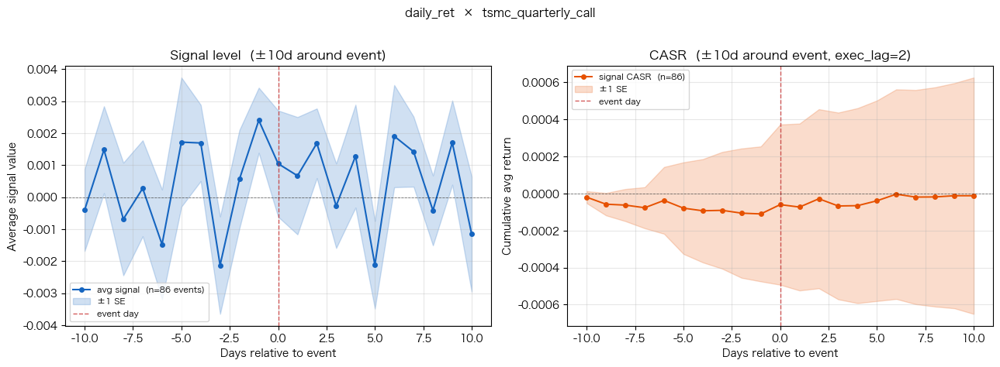


>>> ret_mean_5d around tsmc_quarterly_call


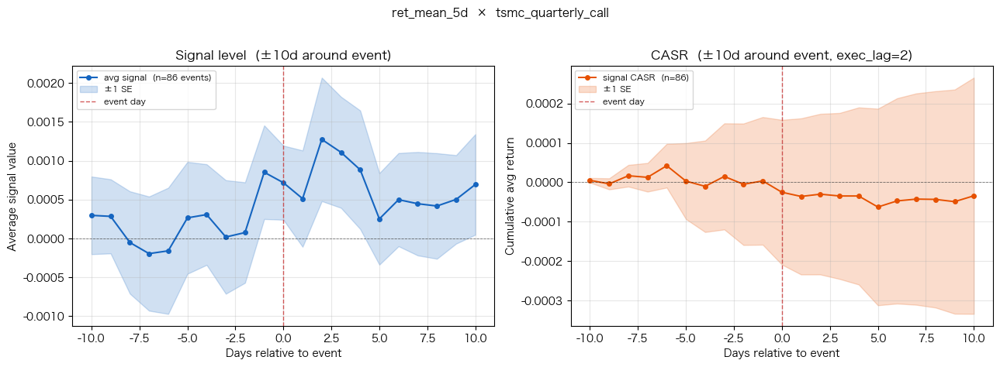


>>> ret_mean_20d around tsmc_quarterly_call


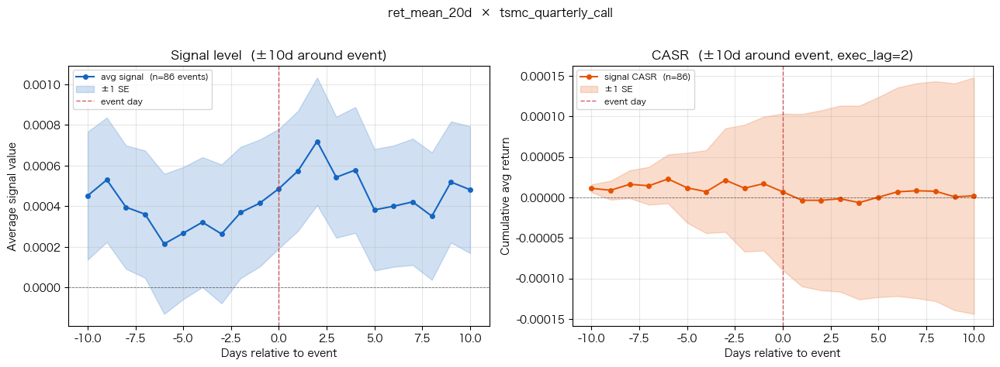


>>> abs_ret around tsmc_quarterly_call


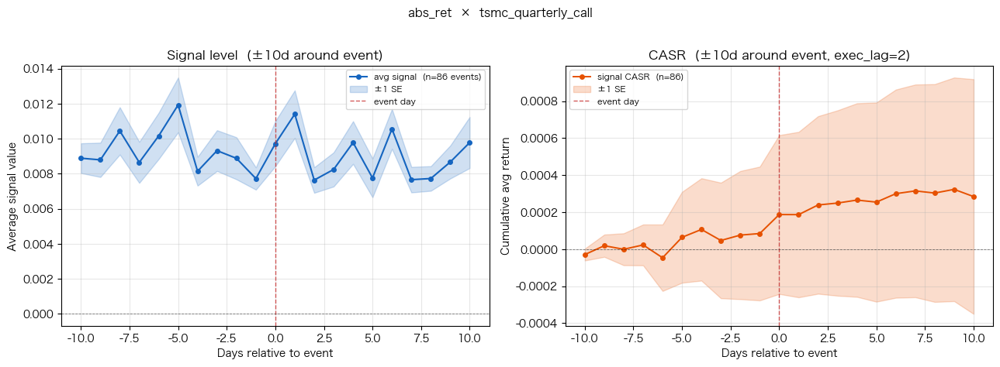


>>> high_low_range around tsmc_quarterly_call


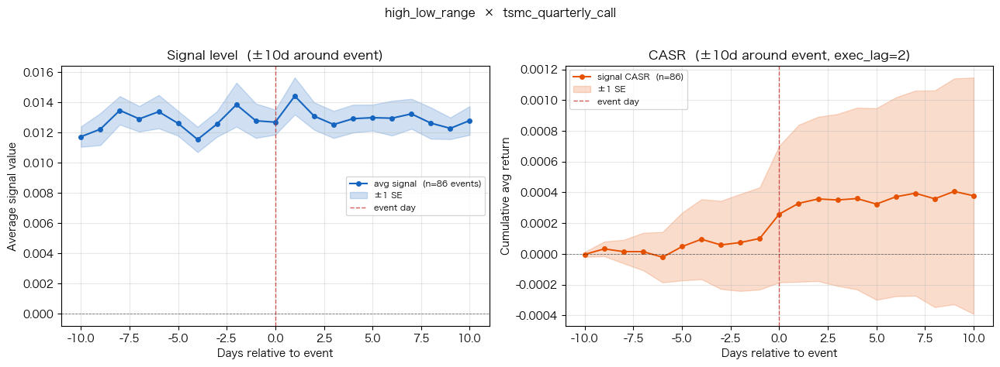


>>> volume_z20 around tsmc_quarterly_call


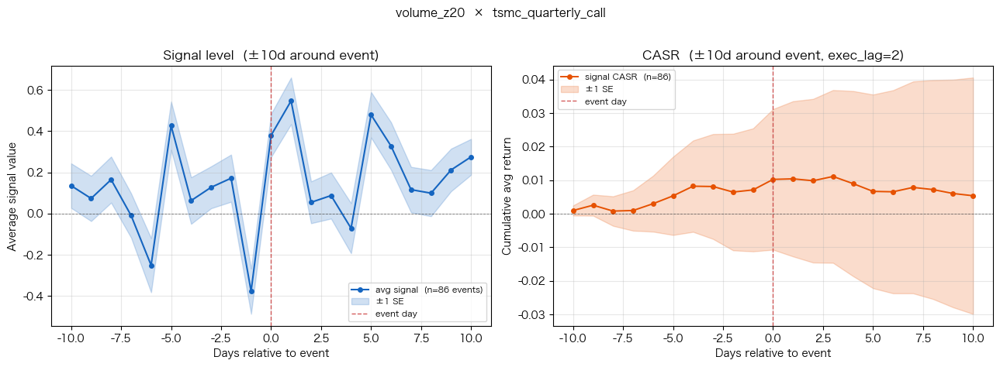

In [4]:
# TSMC quarterly earnings calls — the highest-quality event (86 events, 20 yrs)
for nm, sig in SIGNALS.items():
    print(f"\n>>> {nm} around tsmc_quarterly_call")
    cta.Casr(WINDOW, sig, EVENTS["tsmc_quarterly_call"] == 0,
             title=f"{nm}  ×  tsmc_quarterly_call")



>>> daily_ret around futures_expire


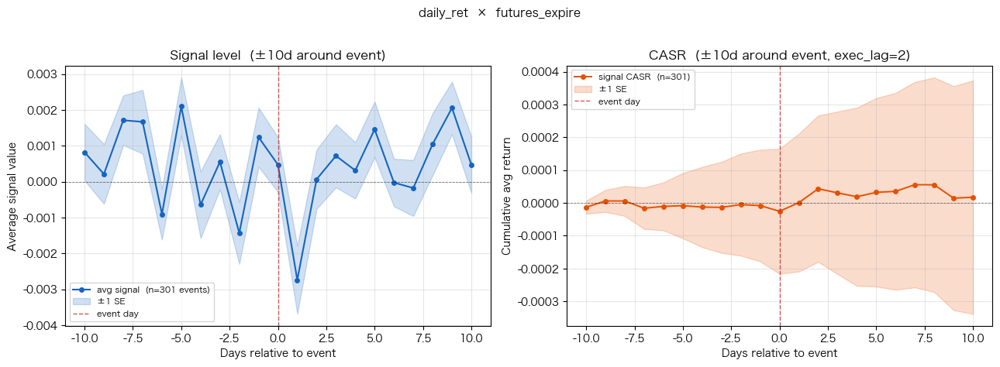


>>> ret_mean_5d around futures_expire


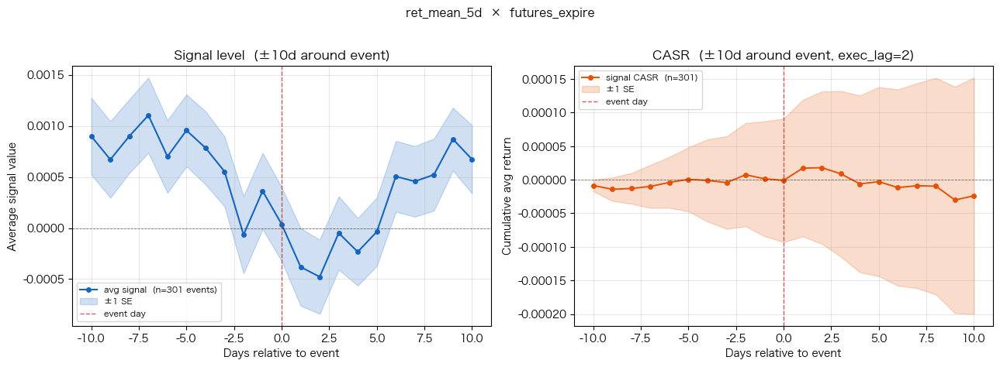


>>> ret_mean_20d around futures_expire


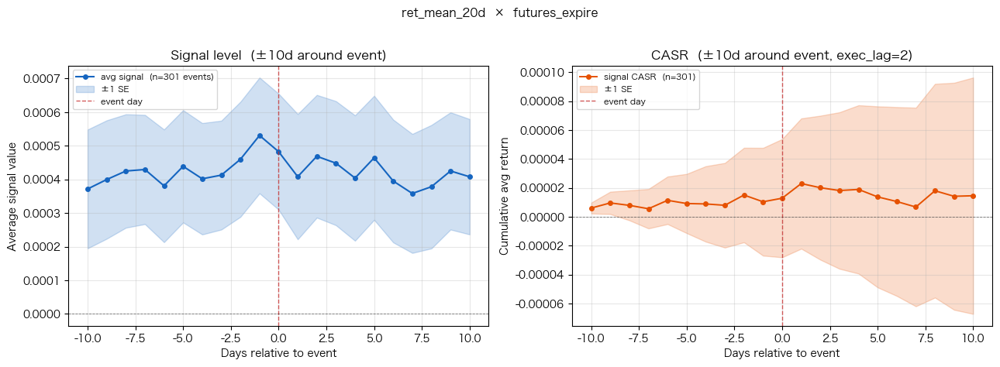


>>> abs_ret around futures_expire


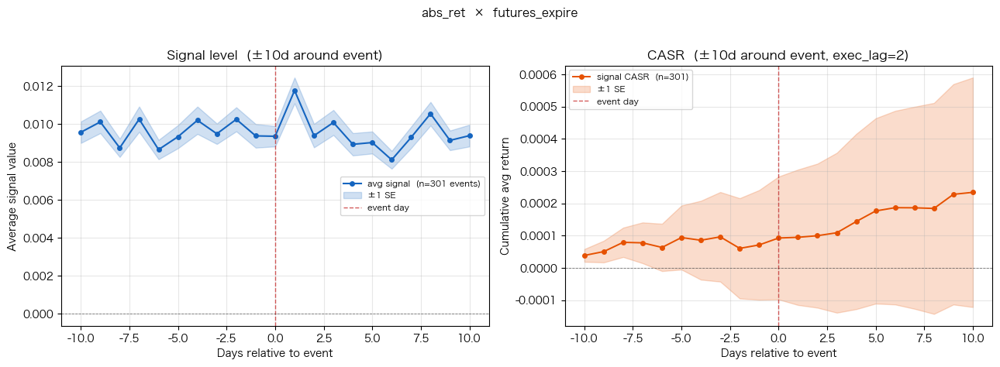


>>> high_low_range around futures_expire


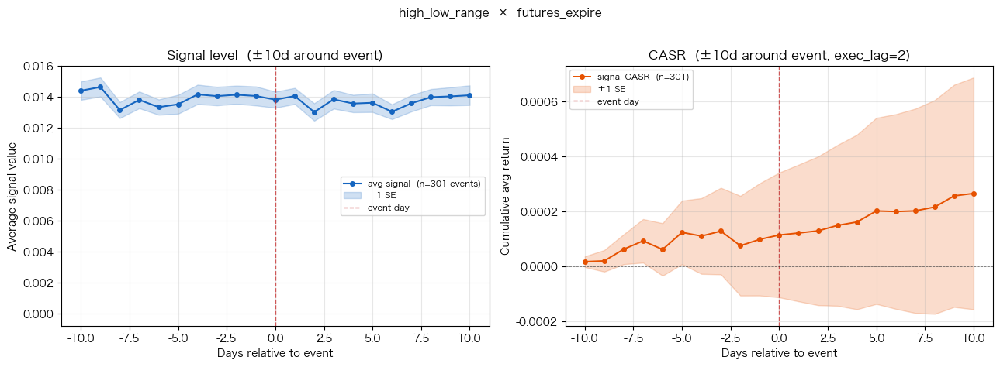


>>> volume_z20 around futures_expire


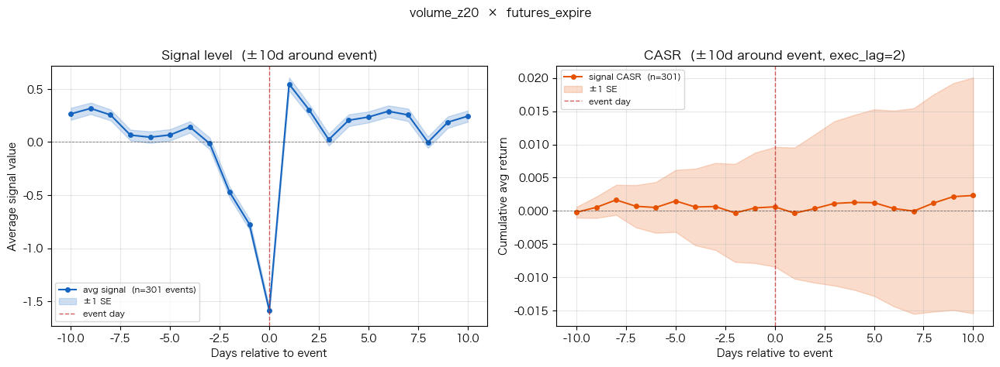

In [5]:
# TAIFEX monthly expiry (3rd Wednesday) — 303 events
for nm, sig in SIGNALS.items():
    print(f"\n>>> {nm} around futures_expire")
    cta.Casr(WINDOW, sig, EVENTS["futures_expire"] == 0,
             title=f"{nm}  ×  futures_expire")



>>> daily_ret around tsmc_broker_conference


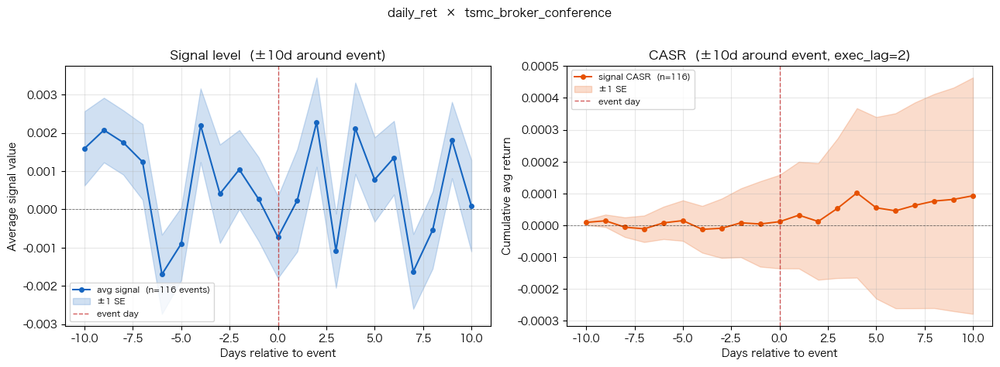


>>> ret_mean_5d around tsmc_broker_conference


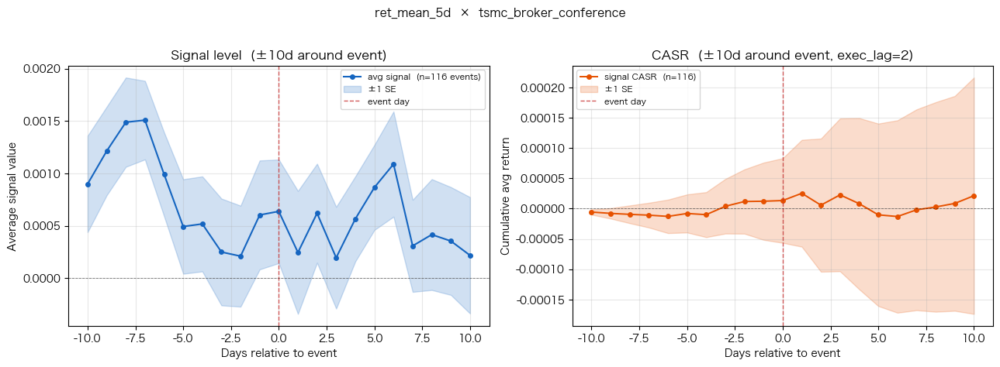


>>> ret_mean_20d around tsmc_broker_conference


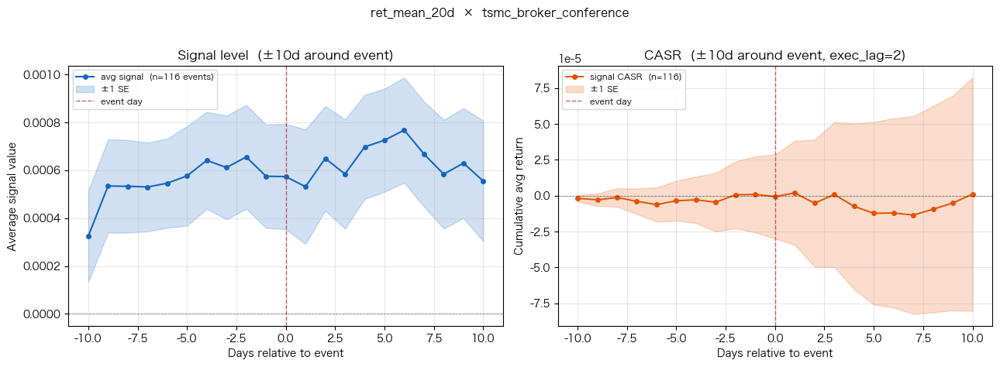


>>> abs_ret around tsmc_broker_conference


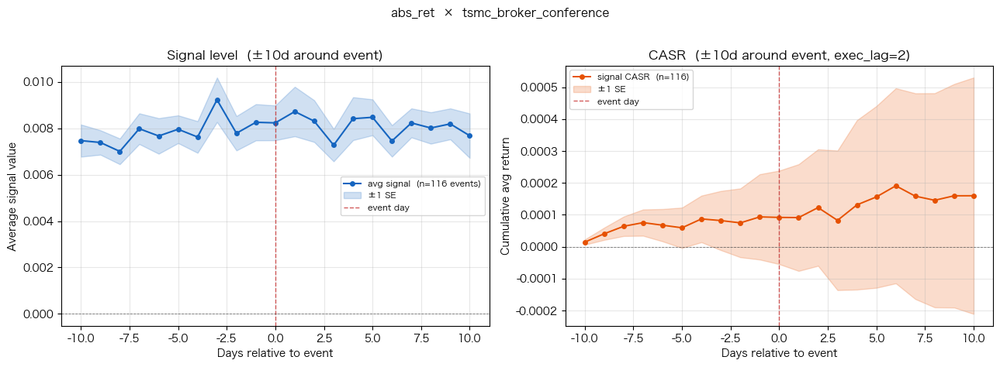


>>> high_low_range around tsmc_broker_conference


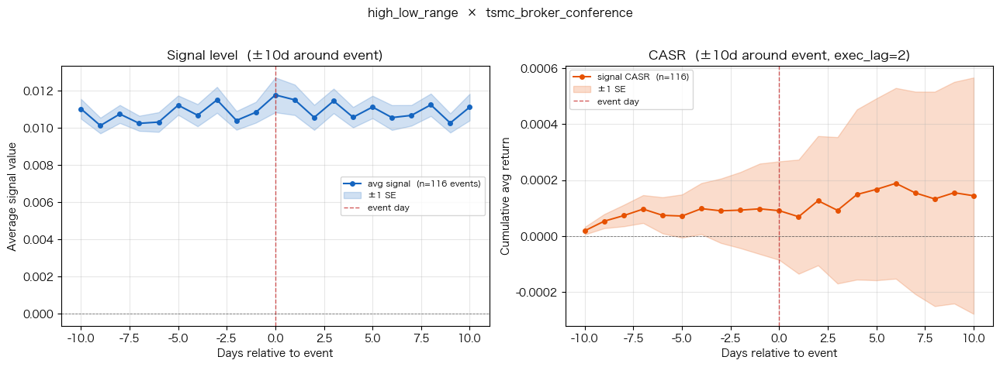


>>> volume_z20 around tsmc_broker_conference


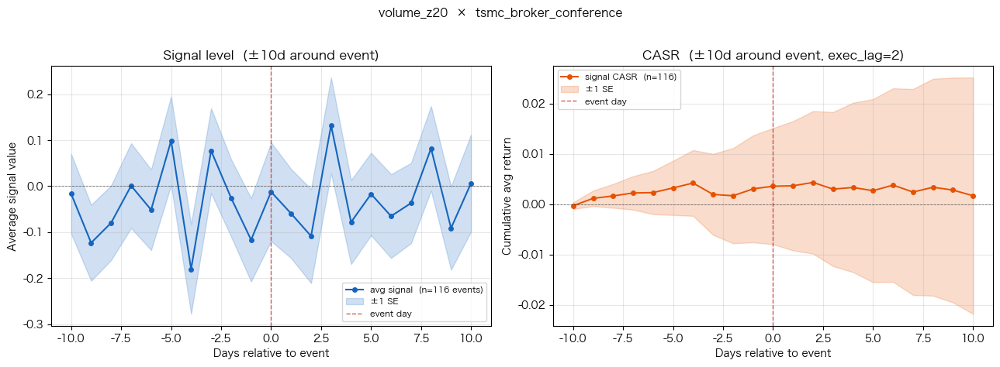

In [6]:
# TSMC broker conferences — 116 events, expected weaker effect (re-broadcast content)
for nm, sig in SIGNALS.items():
    print(f"\n>>> {nm} around tsmc_broker_conference")
    cta.Casr(WINDOW, sig, EVENTS["tsmc_broker_conference"] == 0,
             title=f"{nm}  ×  tsmc_broker_conference")


## 4. Investor Day — small sample caveat

Only 4 events (2018, 2022, 2025, 2026) — statistical noise dominates. Included for completeness but treat SE bands as very wide.



>>> daily_ret around tsmc_investor_day  (n=4 — tiny sample!)


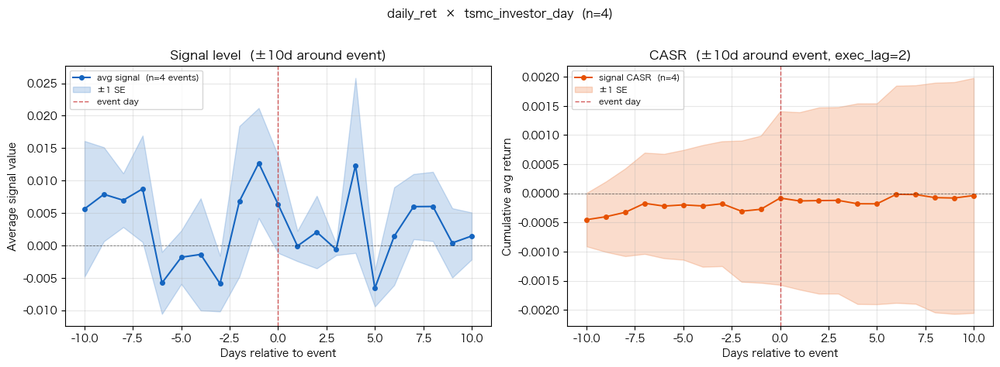


>>> ret_mean_5d around tsmc_investor_day  (n=4 — tiny sample!)


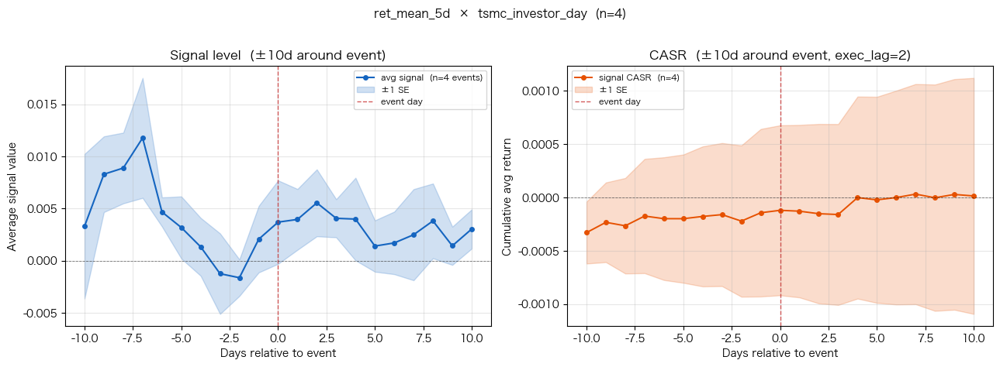


>>> ret_mean_20d around tsmc_investor_day  (n=4 — tiny sample!)


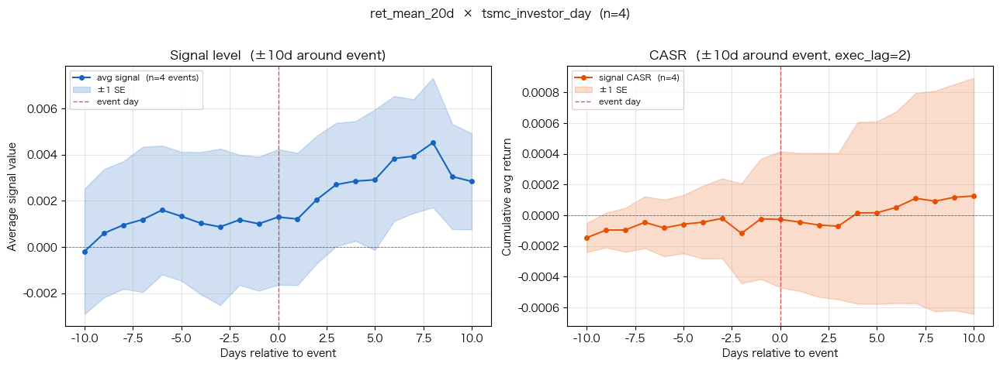


>>> abs_ret around tsmc_investor_day  (n=4 — tiny sample!)


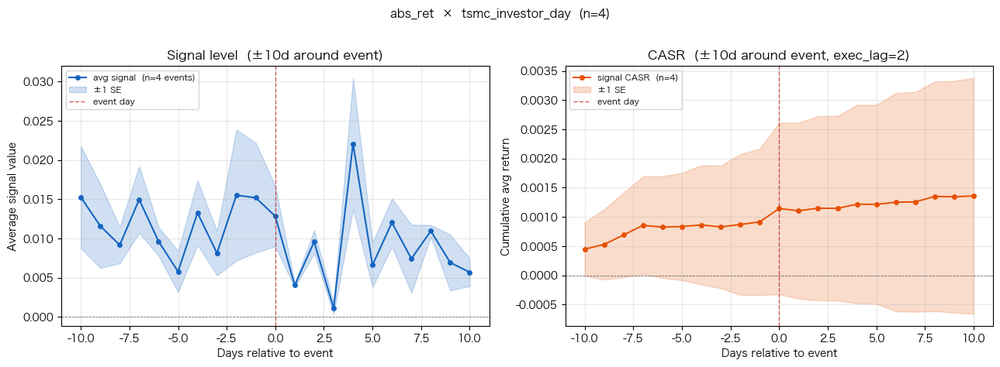


>>> high_low_range around tsmc_investor_day  (n=4 — tiny sample!)


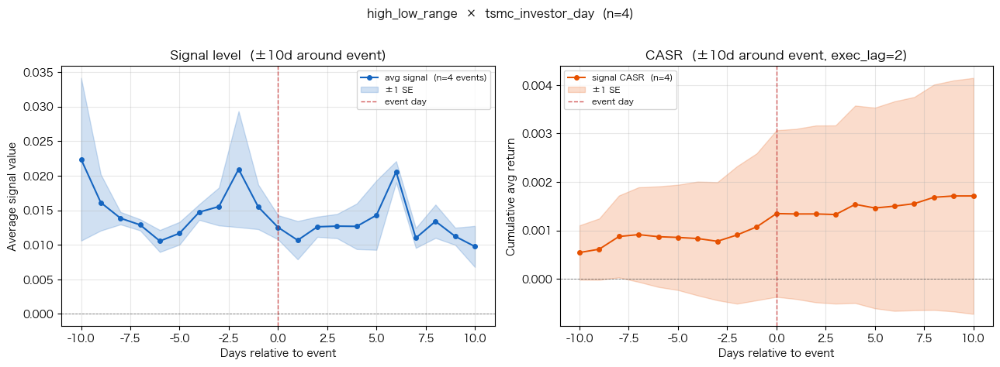


>>> volume_z20 around tsmc_investor_day  (n=4 — tiny sample!)


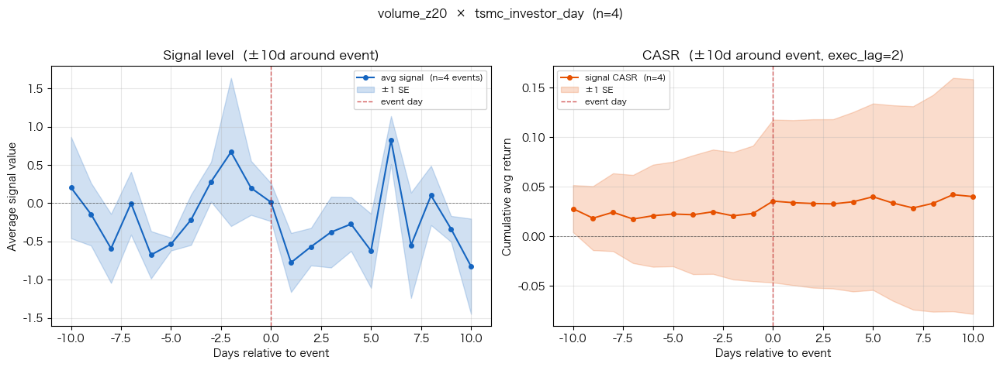

In [7]:
for nm, sig in SIGNALS.items():
    print(f"\n>>> {nm} around tsmc_investor_day  (n=4 — tiny sample!)")
    try:
        cta.Casr(WINDOW, sig, EVENTS["tsmc_investor_day"] == 0,
                 title=f"{nm}  ×  tsmc_investor_day  (n=4)")
    except ValueError as e:
        print(f"    skipped: {e}")


## 5. Cross-event summary — signal average at t=0 vs signal average over the window

Quick numeric summary: for every signal × event pair, compare **the signal's mean value ON the event day** to its **mean over the whole ±WINDOW window**. A significant gap (in SE units) is a candidate anomaly worth deeper study.


In [8]:
rows = []
for ev_name, ev in EVENTS.items():
    ev_mask = ev == 0
    for sig_name, sig in SIGNALS.items():
        try:
            r = cta.Casr(WINDOW, sig, ev_mask, show=False)
            plt.close("all")
        except ValueError:
            continue
        sa = r["signal_avg"]
        mean_at_event  = sa.loc[0, "mean"]
        se_at_event    = sa.loc[0, "se"]
        window_mean    = sa["mean"].mean()
        # z of "event-day mean" vs "window baseline" (SE at event day)
        z = (mean_at_event - window_mean) / se_at_event if se_at_event else np.nan
        casr_end = r["casr"]["casr"].iloc[-1]
        rows.append({
            "event": ev_name, "signal": sig_name,
            "n_events": int(r["casr"]["n"].iloc[0]),
            "mean_at_event": mean_at_event, "window_mean": window_mean,
            "z_at_event_vs_window": z,
            "casr_end": casr_end,
        })

summary = pd.DataFrame(rows)
print("=== Signal-at-event vs window baseline (|z|>1 = interesting) ===\n")
display(summary.sort_values("z_at_event_vs_window", key=lambda s: s.abs(),
                             ascending=False).round(5))

print("\n=== Signal CASR sorted by absolute magnitude ===\n")
display(summary.sort_values("casr_end", key=lambda s: s.abs(),
                             ascending=False).round(5)[
    ["event","signal","n_events","casr_end"]])


=== Signal-at-event vs window baseline (|z|>1 = interesting) ===



,event,signal,n_events,mean_at_event,window_mean,z_at_event_vs_window,casr_end
23,futures_expire,volume_z20,301,-1.58317,0.02900,-46.95653,0.00232
5,tsmc_quarterly_call,volume_z20,86,0.37911,0.14409,2.23661,0.00537
12,tsmc_broker_conference,daily_ret,116,-0.00073,0.00060,-1.24159,0.00009
19,futures_expire,ret_mean_5d,301,0.00004,0.00042,-1.04895,-0.00002
16,tsmc_broker_conference,high_low_range,116,0.01176,0.01085,0.98089,0.00014
10,tsmc_investor_day,high_low_range,4,0.01254,0.01408,-0.87823,0.00171
11,tsmc_investor_day,volume_z20,4,0.01170,-0.20092,0.85558,0.04027
9,tsmc_investor_day,abs_ret,4,0.01283,0.01036,0.64073,0.00136
1,tsmc_quarterly_call,ret_mean_5d,86,0.00072,0.00043,0.60506,-0.00003
3,tsmc_quarterly_call,abs_ret,86,0.00971,0.00913,0.44973,0.00028



=== Signal CASR sorted by absolute magnitude ===



,event,signal,n_events,casr_end
11,tsmc_investor_day,volume_z20,4,0.04027
5,tsmc_quarterly_call,volume_z20,86,0.00537
23,futures_expire,volume_z20,301,0.00232
10,tsmc_investor_day,high_low_range,4,0.00171
17,tsmc_broker_conference,volume_z20,116,0.00165
9,tsmc_investor_day,abs_ret,4,0.00136
4,tsmc_quarterly_call,high_low_range,86,0.00038
3,tsmc_quarterly_call,abs_ret,86,0.00028
22,futures_expire,high_low_range,301,0.00027
21,futures_expire,abs_ret,301,0.00023


## 6. Constructing event signals — three forms

The features in §2 are always-on (defined every bar). But event-driven signals should be **active only near events** and NaN elsewhere. Three canonical constructions, all built on the new operators `cta.EventFFill` and `cta.EventRollingFFill`:

| form | operator call | interpretation |
|---|---|---|
| **1. Feature sampled at event** | `EventFFill(feat, ev==0, offset=k, limit=L)` | sample the raw feature ON (k=0) / before (k=-1) / after (k=+1) the event, hold for L bars |
| **2. Rolling-mean sampled at event** | `EventRollingFFill(feat, ev==0, window=W, offset=0, limit=L)` | InstMean(W, feat) sampled ON the event, held for L bars |
| **3. Post-event rolling mean, sampled after window closes** | `EventRollingFFill(feat, ev==0, window=W, offset=W, limit=L)` | mean of the W bars STRICTLY AFTER the event, sampled at event+W, held for L bars |

Between events (or beyond L), the signal is NaN — trading logic downstream sees an explicit "not active" state. Every event resets the ffill.

The user's original spec `f.InstMean(5, feat) / f.Lag(6, event==0)` is exactly Form 3 with `window=5, offset=5` (mean of the 5 post-event bars, sampled at event+5).


In [9]:
# ── § 6.1  Build one signal from each form + variants ──────────────────────

close     = ASSET["close"].astype(float)
high      = ASSET["high"].astype(float)
low       = ASSET["low"].astype(float)
volume    = ASSET["volume"].astype(float) if "volume" in ASSET.columns else None

daily_ret       = close.pct_change().rename("daily_ret")
high_low_range  = ((high - low) / close).rename("high_low_range")
vol_z20 = ((volume - cta.InstMean(20, volume)) /
           cta.InstStdev(20, volume).replace(0, np.nan)).rename("vol_z20") if volume is not None else None

ev_qc  = cta.Event("tsmc_quarterly_call")
ev_mask = (ev_qc == 0).astype(float)

# Assemble a dict of event-signals — 3 forms x a couple features & offsets
EVENT_SIGNALS = {
    # Form 1 — sample raw feature
    "F1_ret_on_event_L5":      cta.EventFFill(daily_ret,      ev_mask, offset= 0, limit=5),
    "F1_ret_pre_event_L5":     cta.EventFFill(daily_ret,      ev_mask, offset=-1, limit=5),
    "F1_ret_post_event_L5":    cta.EventFFill(daily_ret,      ev_mask, offset=+1, limit=5),
    "F1_range_on_event_L5":    cta.EventFFill(high_low_range, ev_mask, offset= 0, limit=5),

    # Form 2 — rolling-mean sampled AT event
    "F2_retmean5_on_event_L5":   cta.EventRollingFFill(daily_ret, ev_mask, window=5,  offset=0, limit=5),
    "F2_retmean20_on_event_L10": cta.EventRollingFFill(daily_ret, ev_mask, window=20, offset=0, limit=10),

    # Form 3 — post-event rolling mean, sampled after window closes
    "F3_ret_postmean5_L5":       cta.EventRollingFFill(daily_ret, ev_mask, window=5,  offset=5,  limit=5),
    "F3_ret_postmean10_L10":     cta.EventRollingFFill(daily_ret, ev_mask, window=10, offset=10, limit=10),
    "F3_range_postmean5_L5":     cta.EventRollingFFill(high_low_range, ev_mask, window=5, offset=5, limit=5),
}
if vol_z20 is not None:
    EVENT_SIGNALS["F1_volz_on_event_L5"]  = cta.EventFFill(vol_z20, ev_mask, offset=0, limit=5)
    EVENT_SIGNALS["F2_volz5_on_event_L5"] = cta.EventRollingFFill(vol_z20, ev_mask, window=5, offset=0, limit=5)

# Coverage report — how many bars is each signal active for?
print(f"{'signal':38s}  {'active_bars':>11s}  {'unique_vals':>11s}  {'mean':>10s}  {'std':>10s}")
for nm, s in EVENT_SIGNALS.items():
    print(f"  {nm:38s}  {s.notna().sum():>9d}    {s.dropna().nunique():>9d}    "
          f"{s.mean():>+8.5f}   {s.std():>8.5f}")


signal                                  active_bars  unique_vals        mean         std
  F1_ret_on_event_L5                            516           86    +0.00105    0.01533
  F1_ret_pre_event_L5                           516           86    +0.00240    0.00940
  F1_ret_post_event_L5                          516           86    +0.00067    0.01693
  F1_range_on_event_L5                          516           86    +0.01268    0.00766
  F2_retmean5_on_event_L5                       516           86    +0.00072    0.00440
  F2_retmean20_on_event_L10                     946           86    +0.00049    0.00271
  F3_ret_postmean5_L5                           516           86    +0.00025    0.00543
  F3_ret_postmean10_L10                         946           86    +0.00047    0.00423
  F3_range_postmean5_L5                         516           86    +0.01318    0.00676
  F1_volz_on_event_L5                           516           86    +0.37911    0.96970
  F2_volz5_on_event_L5         

In [12]:
# ── § 6.2  Batch stats — treat the event signals as tradeable ─────────────
# Each signal is only non-NaN on event days + up to `limit` days after.
# Between events the signal is NaN → cta.Simulate treats that as ZERO position
# (no exposure), so PnL only accumulates during the active windows.

IN_SAMPLE_START = "2013-01-01"; IN_SAMPLE_END = "2024-12-31"
OOS_START       = "2025-01-01"; OOS_END       = "2026-06-26"

tbl_is  = cta.batch_signal_stats(EVENT_SIGNALS, ASSET,
                                  start=IN_SAMPLE_START, end=IN_SAMPLE_END)
# Sign-flip so long-market is +1, then evaluate OOS
signed = {nm: EVENT_SIGNALS[nm] * int(tbl_is.loc[nm, "sign"]) for nm in tbl_is.index}
tbl_oos = cta.batch_signal_stats(signed, ASSET, start=OOS_START, end=OOS_END, auto_flip=False)
tbl_oos = tbl_oos.rename(columns={c: f"{c}_oos" for c in tbl_oos.columns if c != "sign"}).drop(columns=["sign"], errors="ignore")

event_stats = tbl_is.join(tbl_oos, how="inner")
event_stats["oos_is_ratio"] = (event_stats["SR_net_oos"] /
                                event_stats["SR_net"].clip(lower=0.05)).round(3)

show = ["sign","SR_net","SR_net_oos","oos_is_ratio","beta","SR_of_SR",
        "alpha_ann_pct","held_pct","turnover_ann"]
print(f"=== § 6.2  Event-signal batch stats  (IS {IN_SAMPLE_START}..{IN_SAMPLE_END},  OOS {OOS_START}..{OOS_END}) ===\n")
display(event_stats.sort_values("SR_net", ascending=False)[show].round(3))

# Quality gates
gate = ((event_stats["SR_net"]>0.3) & (event_stats["SR_net_oos"]>0) &
        (event_stats["beta"].abs()<0.15) & (event_stats["SR_of_SR"]>0.5))
print(f"\nPassers of all 4 gates (SR>0.3 IS, SR>0 OOS, |β|<0.15, SR_of_SR>0.5): "
      f"{int(gate.sum())} / {len(event_stats)}")
if gate.sum():
    display(event_stats[gate][show].round(3))


=== § 6.2  Event-signal batch stats  (IS 2013-01-01..2024-12-31,  OOS 2025-01-01..2026-06-26) ===



,sign,SR_net,SR_net_oos,oos_is_ratio,beta,SR_of_SR,alpha_ann_pct,held_pct,turnover_ann
signal,,,,,,,,,
F1_volz_on_event_L5,1,1.147,0.989,0.862,0.460,0.577,13.297,100.00,33.36
F1_range_on_event_L5,1,1.022,4.805,4.702,0.011,0.537,0.080,45.83,0.44
F3_range_postmean5_L5,1,0.805,2.794,3.471,0.014,0.568,-0.006,45.83,0.44
F1_ret_on_event_L5,1,0.761,3.250,4.271,-0.003,0.149,0.140,33.33,0.30
F1_ret_post_event_L5,-1,0.662,2.954,4.462,0.003,0.218,0.135,35.42,0.41
F2_volz5_on_event_L5,-1,0.488,1.822,3.734,-0.043,0.345,4.675,97.92,18.23
F2_retmean20_on_event_L10,-1,0.359,-1.422,-3.961,-0.000,0.042,0.018,0.00,0.04
F3_ret_postmean10_L10,-1,0.326,-3.489,-10.702,0.001,-0.273,0.016,2.08,0.06
F3_ret_postmean5_L5,-1,0.197,0.845,4.289,0.004,-0.030,-0.042,2.08,0.14



Passers of all 4 gates (SR>0.3 IS, SR>0 OOS, |β|<0.15, SR_of_SR>0.5): 2 / 11


,sign,SR_net,SR_net_oos,oos_is_ratio,beta,SR_of_SR,alpha_ann_pct,held_pct,turnover_ann
signal,,,,,,,,,
F1_range_on_event_L5,1,1.022,4.805,4.702,0.011,0.537,0.080,45.83,0.44
F3_range_postmean5_L5,1,0.805,2.794,3.471,0.014,0.568,-0.006,45.83,0.44


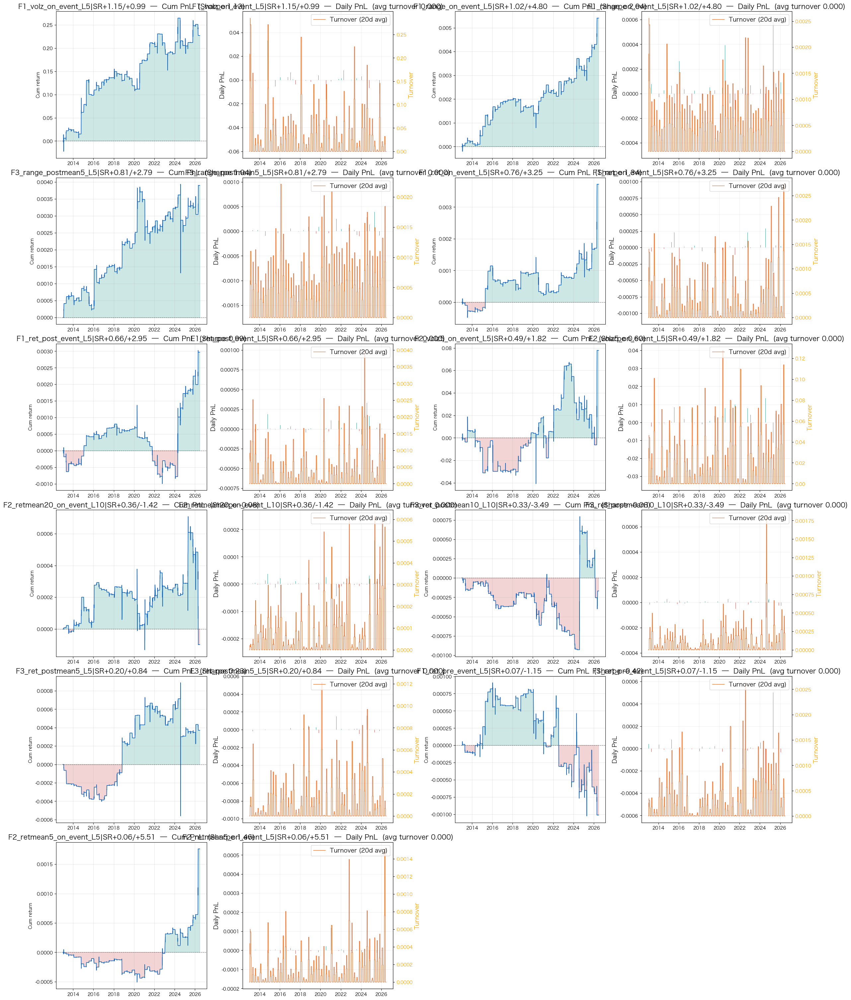

In [13]:
# ── § 6.3  SimulateAll — side-by-side backtest grid for all event signals ─
# Uses SIGNED signals (sign-flipped for long-market convention) so cum-PnL
# lines trend up when the edge is real. normalize=False keeps raw feature
# magnitudes — the event signal is already sparse and scaled.

sigs_ordered = [(nm, signed[nm]) for nm in event_stats.sort_values("SR_net", ascending=False).index]
sigs_series  = [s for _, s in sigs_ordered]
sigs_names   = [f"{nm}|SR{event_stats.loc[nm,'SR_net']:+.2f}/{event_stats.loc[nm,'SR_net_oos']:+.2f}"
                for nm, _ in sigs_ordered]

cta.SimulateAll(*sigs_series, names=sigs_names,
                asset="mtx", time_granularity="1d",
                normalize=False,
                start_date=IN_SAMPLE_START, end_date=OOS_END)


### § 6.4  Full diagnostic dashboard — top 3 signals by IS SR_net

`cta.Simulate` plots the full multi-panel diagnostic (cum-PnL, drawdown, PnL hist, per-year, turnover, β analysis, CASR panels). Run only on the top few to keep output manageable.



  F1_volz_on_event_L5    IS SR +1.15  |  OOS SR +0.99  |  β +0.46  |  SR_of_SR 0.58  |  held 100.0%


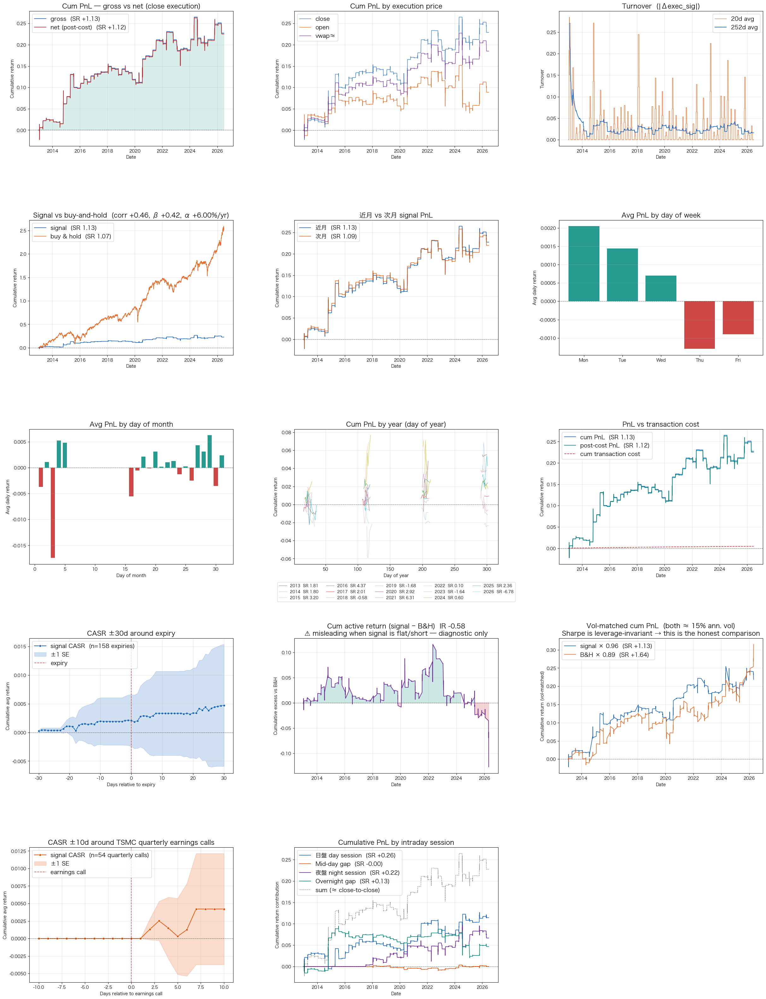


  F1_range_on_event_L5    IS SR +1.02  |  OOS SR +4.80  |  β +0.01  |  SR_of_SR 0.54  |  held 45.8%


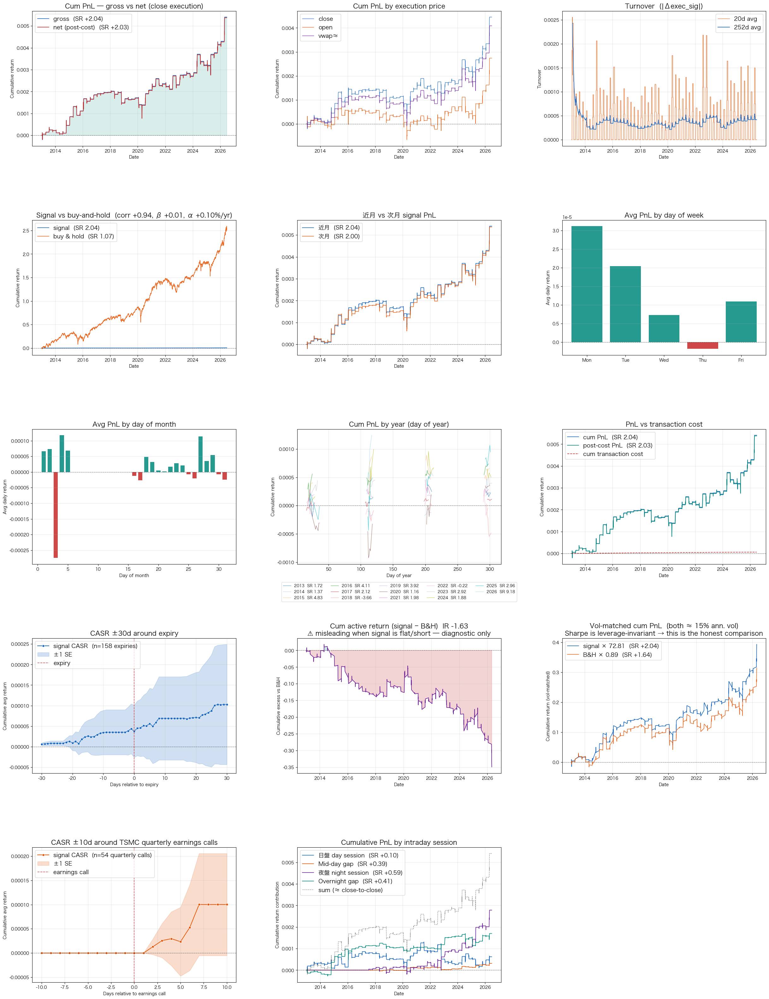


  F3_range_postmean5_L5    IS SR +0.81  |  OOS SR +2.79  |  β +0.01  |  SR_of_SR 0.57  |  held 45.8%


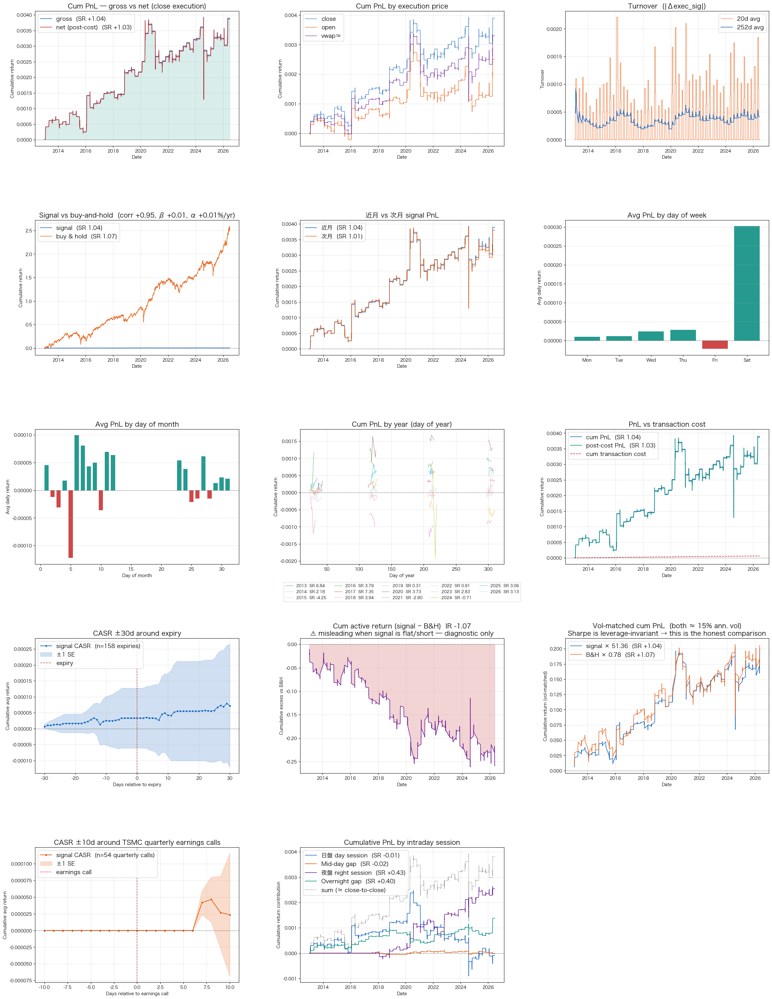

In [14]:
# ── § 6.4  Simulate — top 3 event signals individually ──────────────────
top3 = event_stats.sort_values("SR_net", ascending=False).head(3).index.tolist()
for nm in top3:
    row = event_stats.loc[nm]
    print("\n" + "="*90)
    print(f"  {nm}    IS SR {row['SR_net']:+.2f}  |  OOS SR {row['SR_net_oos']:+.2f}  "
          f"|  β {row['beta']:+.2f}  |  SR_of_SR {row['SR_of_SR']:.2f}  "
          f"|  held {row['held_pct']:.1f}%")
    print("="*90)
    _ = cta.Simulate(signed[nm], asset="mtx", time_granularity="1d",
                     normalize=False,
                     start_date=IN_SAMPLE_START, end_date=OOS_END)


## 7. Auto-scan CASR peaks → build filtered event signals

For each `(feature × event_type)` pair, scan the per-day means of the CASR right-panel and flag days `k` where the per-event return is meaningfully above noise (|mean/SE| > threshold).

Timing arithmetic (matters because Simulate uses `signal.shift(2)`):

- The CASR at relative offset `k` represents PnL landing at bar `event + k`
- To reproduce that PnL in a live strategy, `signal` must be non-zero at bar `event + k − 2`
- On that bar, `Event[t] == k − 2`. **Filter: `Event == k − 2`.**
- Sign of the constructed signal = sign of the mean return at `k` (so it's aligned long-market by construction)

Worked example (user's spec): the pre-event *signal value* at `t=-1` looks predictive → we want the trade to land on the event day (`k=0`). Filter = `Event == 0 − 2 = −2` ✓.


In [15]:
# ── § 7.1  Scan every (feature × event) pair for significant CASR days ────

SCAN_FEATURES = {
    "daily_ret":      daily_ret,
    "high_low_range": high_low_range,
    "abs_ret":        daily_ret.abs(),
    "ret_mean_5d":    cta.InstMean(5,  daily_ret),
}
if vol_col := ("volume" in ASSET.columns):
    SCAN_FEATURES["vol_z20"] = ((ASSET["volume"] - cta.InstMean(20, ASSET["volume"])) /
                                cta.InstStdev(20, ASSET["volume"]).replace(0, np.nan))

SCAN_EVENTS = {n: EVENTS[n] for n in
               ["tsmc_quarterly_call","tsmc_broker_conference","futures_expire"]}

Z_THRESHOLD = 1.0    # |per-day mean / SE| above this counts as a peak
SCAN_DAYS   = 15

scan_rows = []
for ev_name, ev in SCAN_EVENTS.items():
    ev_mask = ev == 0
    for feat_name, feat in SCAN_FEATURES.items():
        try:
            r = cta.Casr(SCAN_DAYS, feat, ev_mask, show=False); plt.close("all")
        except ValueError:
            continue
        casr_df = r["casr"]              # cols: casr, mean, se, n
        z       = casr_df["mean"] / casr_df["se"].replace(0, np.nan)
        peaks   = z[z.abs() > Z_THRESHOLD]
        for k, zval in peaks.items():
            filt_offset = int(k) - 2      # Event == this for signal filter
            scan_rows.append({
                "feature":  feat_name,
                "event":    ev_name,
                "casr_k":   int(k),
                "filter":   f"Event == {filt_offset}",
                "z":        round(float(zval), 3),
                "mean":     round(float(casr_df.loc[k, "mean"]), 6),
                "se":       round(float(casr_df.loc[k, "se"]),   6),
                "n_events": int(casr_df.loc[k, "n"]),
                "sign":     int(np.sign(zval)),
            })

peaks_df = pd.DataFrame(scan_rows).sort_values("z", key=lambda s: s.abs(), ascending=False)
print(f"=== Peaks with |z| > {Z_THRESHOLD} across "
      f"{len(SCAN_FEATURES)} features × {len(SCAN_EVENTS)} events × {SCAN_DAYS*2+1} days ===")
print(f"total peaks: {len(peaks_df)}\n")
display(peaks_df.head(30))


=== Peaks with |z| > 1.0 across 5 features × 3 events × 31 days ===
total peaks: 197



,feature,event,casr_k,filter,z,mean,se,n_events,sign
155,high_low_range,futures_expire,9,Event == 7,3.224,0.000017,0.000005,301,1
194,vol_z20,futures_expire,8,Event == 6,3.200,0.001624,0.000508,301,1
154,high_low_range,futures_expire,8,Event == 6,3.183,0.000022,0.000007,301,1
83,high_low_range,tsmc_broker_conference,-9,Event == -11,3.002,0.000035,0.000012,116,1
55,vol_z20,tsmc_quarterly_call,-14,Event == -16,2.975,0.001561,0.000525,86,1
169,abs_ret,futures_expire,9,Event == 7,2.869,0.000014,0.000005,301,1
139,daily_ret,futures_expire,-1,Event == -3,2.789,0.000020,0.000007,301,1
168,abs_ret,futures_expire,8,Event == 6,2.755,0.000015,0.000006,301,1
70,daily_ret,tsmc_broker_conference,-4,Event == -6,-2.701,-0.000026,0.000010,116,-1
112,abs_ret,tsmc_broker_conference,11,Event == 9,2.541,0.000028,0.000011,116,1


In [16]:
# ── § 7.2  Build filtered event-signals from each detected peak ─────────

FILTERED_SIGNALS = {}
for _, row in peaks_df.iterrows():
    feat_name, ev_name = row["feature"], row["event"]
    filt_offset, sign  = row["casr_k"] - 2, row["sign"]
    feat = SCAN_FEATURES[feat_name]
    ev   = SCAN_EVENTS[ev_name]
    # Signal is active ONLY on the specific event-relative day the peak was found on.
    mask   = (ev == filt_offset).astype(float)
    signal = (feat * mask * sign).rename(
        f"{feat_name}__{ev_name}__filt_E{filt_offset:+d}"
    )
    # Between events (or on days where mask==0), signal is 0 → Simulate treats
    # as zero position, so no exposure between events.
    FILTERED_SIGNALS[signal.name] = signal

# Deduplicate: same (feat, event, offset) may appear if scanned twice
FILTERED_SIGNALS = {k: v for k, v in FILTERED_SIGNALS.items()}
print(f"built {len(FILTERED_SIGNALS)} filtered event-signals")

# Batch stats
tbl_is  = cta.batch_signal_stats(FILTERED_SIGNALS, ASSET,
                                  start=IN_SAMPLE_START, end=IN_SAMPLE_END,
                                  auto_flip=False)   # signs are already correct
signed_filt = FILTERED_SIGNALS   # already sign-flipped in construction
tbl_oos = cta.batch_signal_stats(signed_filt, ASSET, start=OOS_START, end=OOS_END, auto_flip=False)
tbl_oos = tbl_oos.rename(columns={c:f"{c}_oos" for c in tbl_oos.columns if c!="sign"}).drop(columns=["sign"], errors="ignore")
filt_stats = tbl_is.join(tbl_oos, how="inner")
filt_stats["oos_is_ratio"] = (filt_stats["SR_net_oos"] / filt_stats["SR_net"].clip(lower=0.05)).round(3)

show = ["SR_net","SR_net_oos","oos_is_ratio","beta","SR_of_SR","alpha_ann_pct","held_pct","turnover_ann"]
print("\n=== Filtered event-signal stats (ranked by IS SR_net) ===\n")
display(filt_stats.sort_values("SR_net", ascending=False)[show].round(3))

# Quality gates
gate = ((filt_stats["SR_net"]>0.3) & (filt_stats["SR_net_oos"]>0) &
        (filt_stats["beta"].abs()<0.15) & (filt_stats["SR_of_SR"]>0.5))
print(f"\nPassers of all 4 gates: {int(gate.sum())} / {len(filt_stats)}")
if gate.sum():
    display(filt_stats[gate][show].round(3))


built 197 filtered event-signals

=== Filtered event-signal stats (ranked by IS SR_net) ===



,SR_net,SR_net_oos,oos_is_ratio,beta,SR_of_SR,alpha_ann_pct,held_pct,turnover_ann
signal,,,,,,,,
high_low_range__futures_expire__filt_E+6,0.962,0.788,0.819,0.001,1.088,0.038,2.05,0.25
abs_ret__futures_expire__filt_E+6,0.879,0.578,0.658,0.000,0.915,0.028,1.16,0.16
vol_z20__tsmc_quarterly_call__filt_E-16,0.851,-1.086,-1.276,0.003,0.993,1.079,1.57,6.04
daily_ret__tsmc_quarterly_call__filt_E-13,0.829,-0.984,-1.187,-0.000,0.869,0.013,0.34,0.06
vol_z20__futures_expire__filt_E-10,0.825,-1.032,-1.251,0.012,0.377,1.994,1.53,6.28
...,...,...,...,...,...,...,...,...
ret_mean_5d__tsmc_broker_conference__filt_E+9,-0.161,0.841,16.820,-0.000,0.126,-0.001,0.03,0.03
abs_ret__tsmc_broker_conference__filt_E-16,-0.237,-0.590,-11.800,0.000,-0.123,-0.006,0.34,0.05
high_low_range__tsmc_quarterly_call__filt_E-2,-0.255,1.259,25.180,0.000,-0.233,-0.007,0.85,0.09



Passers of all 4 gates: 23 / 184


,SR_net,SR_net_oos,oos_is_ratio,beta,SR_of_SR,alpha_ann_pct,held_pct,turnover_ann
signal,,,,,,,,
high_low_range__futures_expire__filt_E+6,0.962,0.788,0.819,0.001,1.088,0.038,2.05,0.25
abs_ret__futures_expire__filt_E+6,0.879,0.578,0.658,0.000,0.915,0.028,1.16,0.16
vol_z20__futures_expire__filt_E+6,0.792,1.293,1.633,0.018,0.552,2.609,4.91,19.40
abs_ret__tsmc_quarterly_call__filt_E+5,0.675,1.018,1.508,0.000,1.226,0.010,0.31,0.05
daily_ret__tsmc_broker_conference__filt_E+3,0.672,0.842,1.253,0.000,0.771,0.038,0.72,0.10
ret_mean_5d__tsmc_broker_conference__filt_E-12,0.659,0.922,1.399,0.000,0.575,0.004,0.03,0.02
ret_mean_5d__futures_expire__filt_E+7,0.647,0.276,0.427,0.000,0.724,0.008,0.14,0.08
daily_ret__futures_expire__filt_E+7,0.640,0.722,1.128,-0.000,0.652,0.021,1.13,0.18
ret_mean_5d__tsmc_broker_conference__filt_E+7,0.571,0.608,1.065,0.000,0.584,0.004,0.03,0.03


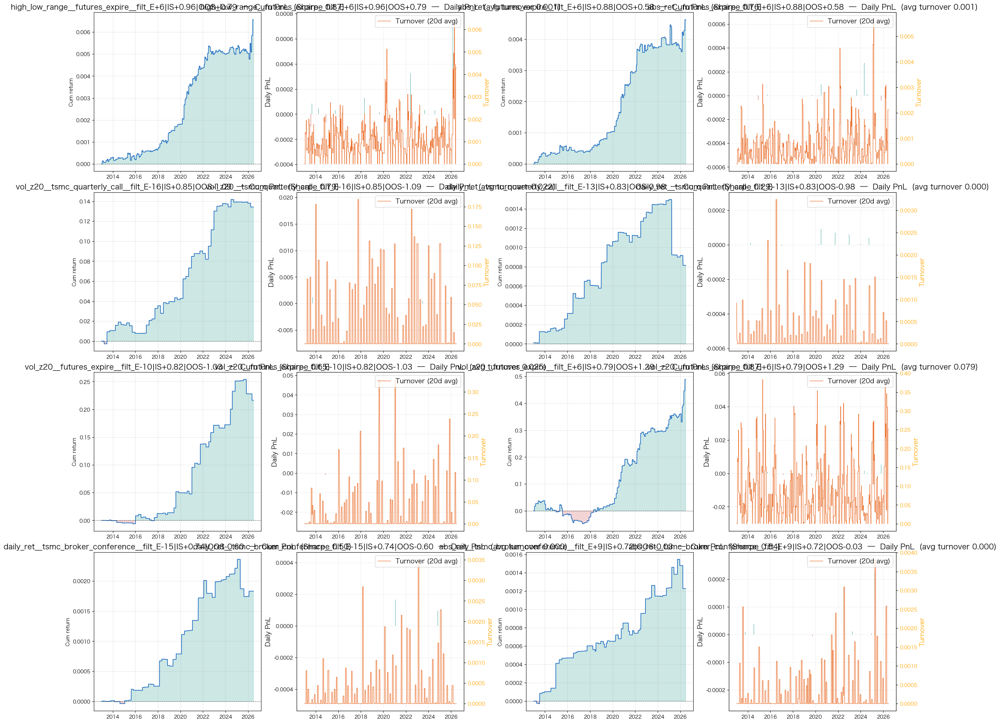


  high_low_range__futures_expire__filt_E+6    IS SR +0.96  |  OOS SR +0.79  |  β +0.00  |  SR_of_SR 1.09  |  held 2.0%


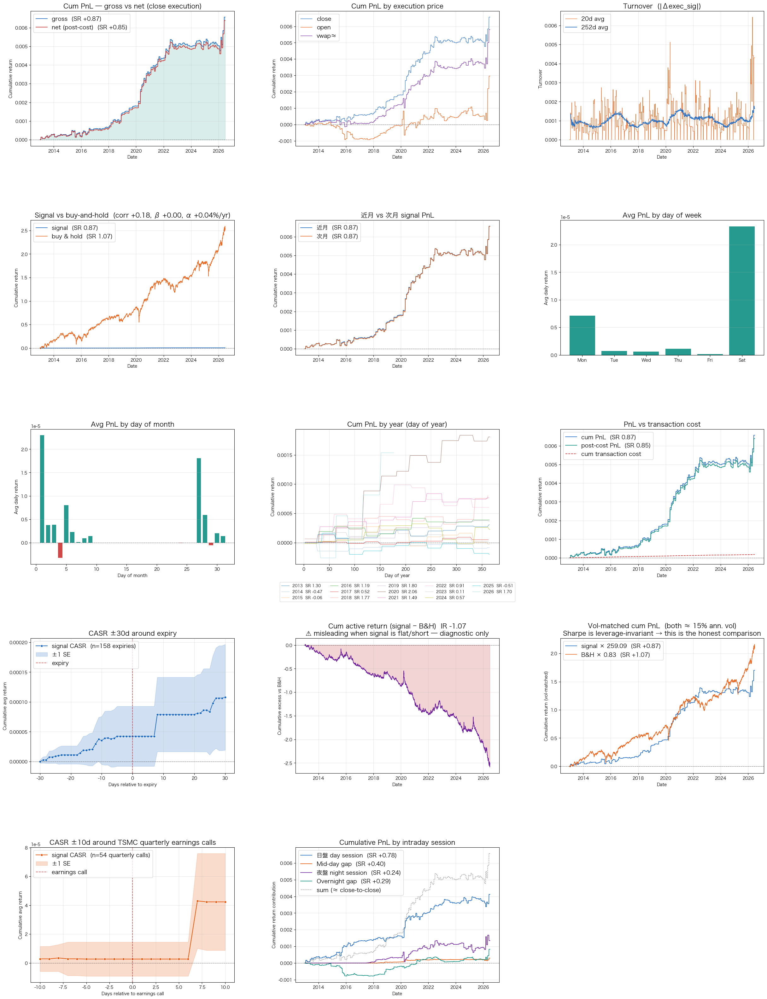


  abs_ret__futures_expire__filt_E+6    IS SR +0.88  |  OOS SR +0.58  |  β +0.00  |  SR_of_SR 0.92  |  held 1.2%


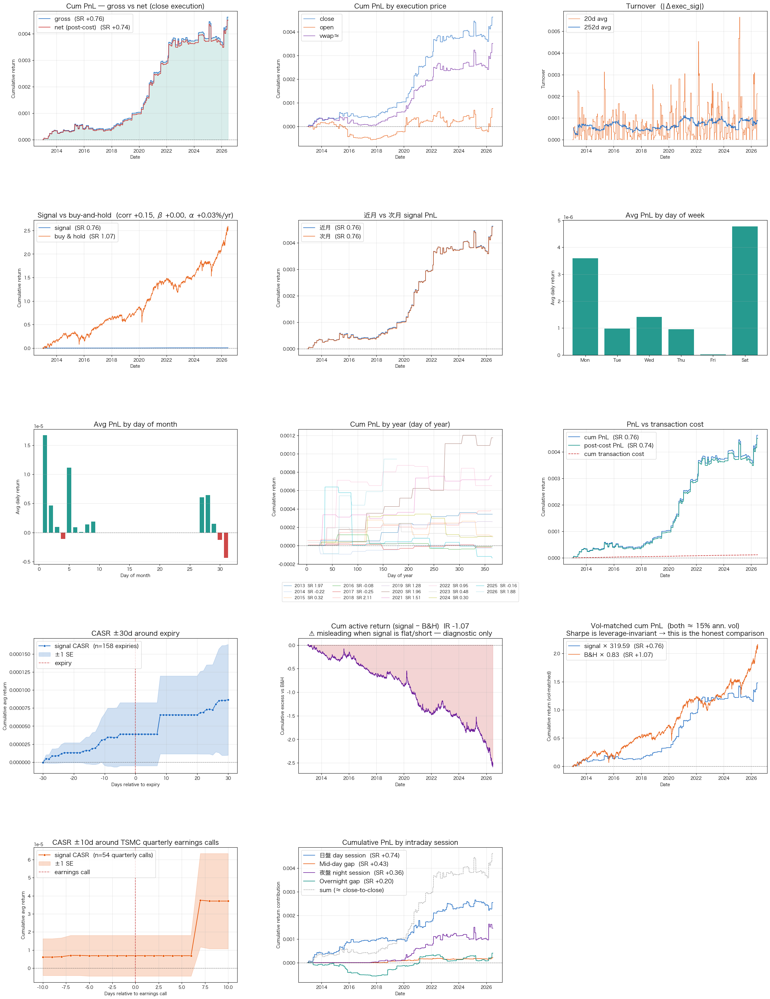


  vol_z20__tsmc_quarterly_call__filt_E-16    IS SR +0.85  |  OOS SR -1.09  |  β +0.00  |  SR_of_SR 0.99  |  held 1.6%


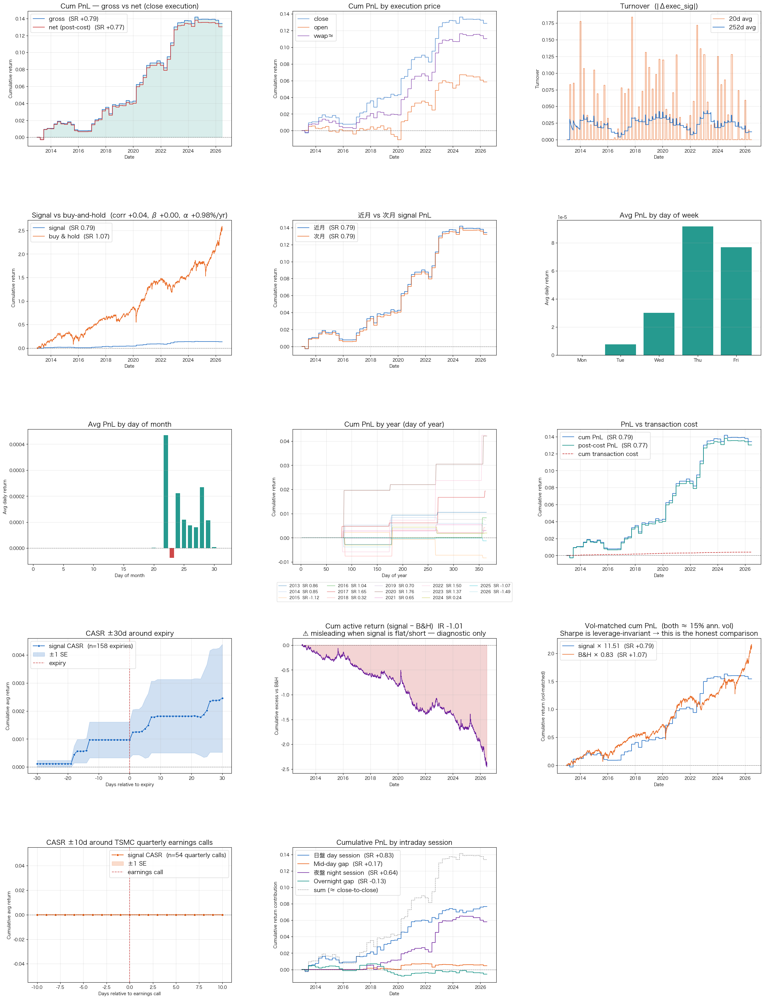

In [17]:
# ── § 7.3  SimulateAll grid + Simulate on top 3 filtered signals ─────────

# Only show the top ~8 for readability
top_keys = filt_stats.sort_values("SR_net", ascending=False).head(8).index.tolist()
sigs   = [FILTERED_SIGNALS[k] for k in top_keys]
names  = [f"{k}|IS{filt_stats.loc[k,'SR_net']:+.2f}|OOS{filt_stats.loc[k,'SR_net_oos']:+.2f}"
          for k in top_keys]

cta.SimulateAll(*sigs, names=names,
                asset="mtx", time_granularity="1d",
                normalize=False,
                start_date=IN_SAMPLE_START, end_date=OOS_END)

# Full diagnostic dashboard on the top 3
for k in top_keys[:3]:
    row = filt_stats.loc[k]
    print("\n" + "="*90)
    print(f"  {k}    IS SR {row['SR_net']:+.2f}  |  OOS SR {row['SR_net_oos']:+.2f}  "
          f"|  β {row['beta']:+.2f}  |  SR_of_SR {row['SR_of_SR']:.2f}  "
          f"|  held {row['held_pct']:.1f}%")
    print("="*90)
    _ = cta.Simulate(FILTERED_SIGNALS[k],
                     asset="mtx", time_granularity="1d",
                     normalize=False,
                     start_date=IN_SAMPLE_START, end_date=OOS_END)
